# Linear Regression with Gradient Descent

In this notebook we will study **Linear Regression**.
We will make some interactive graphs that let us see how it works.

We will use interactive Jupyter widgets and the libraries **matplotlib** and **bqplot** for visualizations

To obtain more info you can read these posts [SPANISH]:
- https://unmonoqueteclea.github.io/machine-learning/regresion-lineal/
- https://unmonoqueteclea.github.io/machine-learning/regresion-lineal/



**Author**: Pablo González Carrizo ([unmonoqueteclea](https://twitter.com/unmonoqueteclea))

**Web**: https://unmonoqueteclea.github.io

## Importing dependencies

In [1]:
#Imports and initial configuration
import numpy as np
from bqplot import ( LinearScale, Axis, Scatter, Lines, Label, Figure)
from ipywidgets import HBox, VBox, IntSlider, Play, jslink, Layout


## Creating point list

In [2]:
#Points
X=np.array([0,10,20,30,40,50,60,70,80,90])
X = np.c_[np.ones(X.shape[0]),X]
y=np.array([90,80,70,60,50,45,35,25,10,0])

## Cost function

In [3]:
def computeCost(X, y, theta=[0,0]):
    m = y.size
    J = 0
    h = X.dot(theta)
    J = 1/(2*m)*np.sum(np.square(h-y))
    return(J)

## Obtain two points from regression line

In [4]:
def get_regression_line(theta,xmin=0,xmax=100):
    ymin= theta[0] + theta[1]*xmin
    ymax= theta[0] + theta[1]*xmax
    return {'X':[xmin,xmax],'Y':[ymin,ymax]}

## Gradient Descent iteration function

In [5]:
def gradientDescentStep(X, y, J_h, regression_line_h, theta=[0,0], alpha=0.0001):
    m = y.size
    h = X.dot(theta)
    theta = theta - alpha*(1/m)*(X.T.dot(h-y))
    J_h.append(computeCost(X, y, theta))
    regression_line_h.append(get_regression_line(theta))
    return(theta, J_h,regression_line_h)

## Defining default regression parameters

In [6]:
def default_parameters():
    global theta,theta_h,J_h,regression_line_h
    #Regression parameters
    theta=[0,0]
    #Theta history
    theta_h=[]
    #Cost history
    J_h=[]
    #Append first value
    theta_h.append(theta)
    J_h.append(computeCost(X,y, theta))
    #Regression line points
    regression_line_h=[get_regression_line(theta)]
    
default_parameters()

## Calculating all iterations

In [7]:
numIter=20000 #20000
for i in range(numIter):
    #Gradient descent iteration
    theta, J_h,regression_line_h= gradientDescentStep(X, y, J_h, regression_line_h, theta, alpha=0.0006) #0.0006

## Defining axis and scalers

In [8]:
#Scalers
sc_x = LinearScale(min=0,max=120)
sc_y = LinearScale(min=0,max=120)
sc_x2 = LinearScale()
sc_y2 = LinearScale()
#Axis
ax_x = Axis(scale=sc_x, label='')
ax_y = Axis(scale=sc_y, orientation='vertical', tick_format='0.2f', label='')
ax_x2 = Axis(scale=sc_x2, label='')
ax_y2 = Axis(scale=sc_y2, orientation='vertical', tick_format='0.2f', label='')

## Creating the graph

In [9]:
scatt = Scatter(x=X[:,1], y=y, scales={'x': sc_x, 'y': sc_y}, colors=['red'])
line = Lines(x=[0,100],y=[0,0],scales={'x': sc_x, 'y': sc_y},colors=['green'])
cost = Lines(x=list(range(numIter)),y=J_h,scales={'x': sc_x2, 'y': sc_y2},colors=['blue'])
costpoints = Scatter(x=[0], y=[0], scales={'x': sc_x2, 'y': sc_y2}, colors=['red'])
fig = Figure(marks=[scatt,line], axes=[ax_x, ax_y],layout=Layout(width='100%'), title="Linear regression")
costfigure = Figure(marks=[cost,costpoints], axes=[ax_x2, ax_y2],layout=Layout(width='100%'),title="Cost function")

## Creating the slider

In [10]:
slider = IntSlider(min=0, max=numIter, step=1, description='Iteration', value=0,layout=Layout(width='100%'))

## On change iteration

In [11]:
def value_changed(change):
    points = regression_line_h[slider.value]
    line.x=points['X']
    line.y=points['Y']
    costpoints.x =[slider.value]
    costpoints.y =[J_h[slider.value]]
slider.observe(value_changed, 'value')

## Displaying the GUI

In [12]:
play_button = Play(min=0, max=numIter, step=250) 
jslink((play_button, 'value'), (slider, 'value'))
VBox([HBox([play_button,slider]), HBox([fig,costfigure])])

A Jupyter Widget

## Creating error plot

<IPython.core.display.Javascript object>


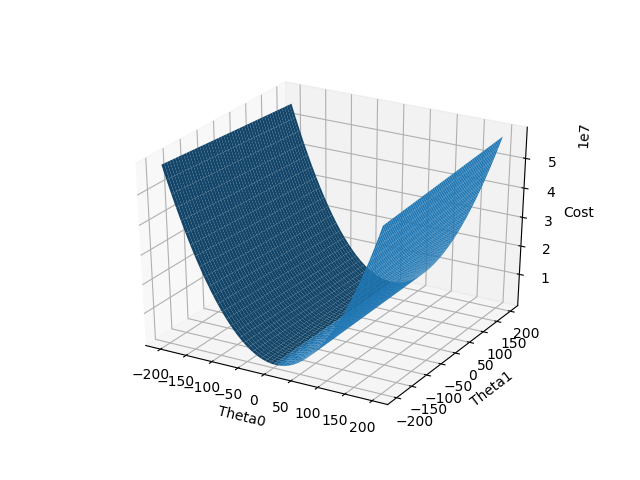

In [13]:
%matplotlib notebook
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import random

minX=-200
maxX=200

def error(theta0, theta1):
   return computeCost(X, y, theta=[theta1,theta0])
   #return theta0**2+ theta1**2

def plot_error():
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    x = y = np.arange(minX, maxX, 1)
    X, Y = np.meshgrid(x, y)
    zs = np.array([error(x,y) for x,y in zip(np.ravel(X), np.ravel(Y))])
    Z = zs.reshape(X.shape)
    ax.plot_surface(X, Y, Z)
    ax.set_xlabel('Theta0')
    ax.set_ylabel('Theta1')
    ax.set_zlabel('Cost')
    plt.show()
    return Z
    
   
Z = plot_error()

## Obtaining ideal theta

In [14]:
i = np.where(Z==Z.min())[0][0]+minX
j = np.where(Z==Z.min())[1][0]+minX
print("Ideal theta: ["+str(i)+ ","+str(j)+"]")

Ideal theta: [91,-1]


As we can see, this values are the same that the ones obtained with gradient descent.

<IPython.core.display.Javascript object>


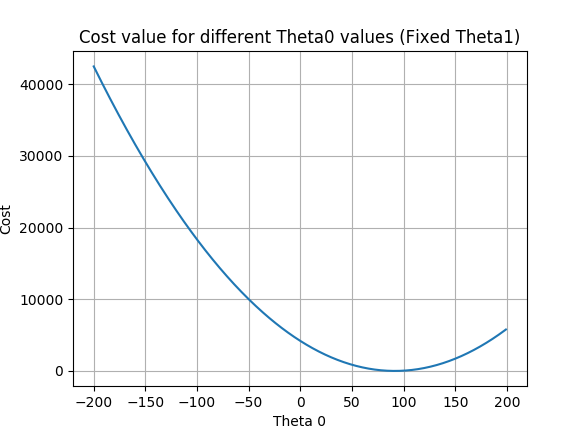

In [15]:
fig = plt.figure()
Z2=Z[:,j+minX]
axisX=np.arange(minX,maxX,1)
plt.plot(axisX,Z2)
plt.xlabel('Theta 0')
plt.ylabel('Cost')
plt.title('Cost value for different Theta0 values (Fixed Theta1)')
plt.grid(True)
plt.show()

<IPython.core.display.Javascript object>


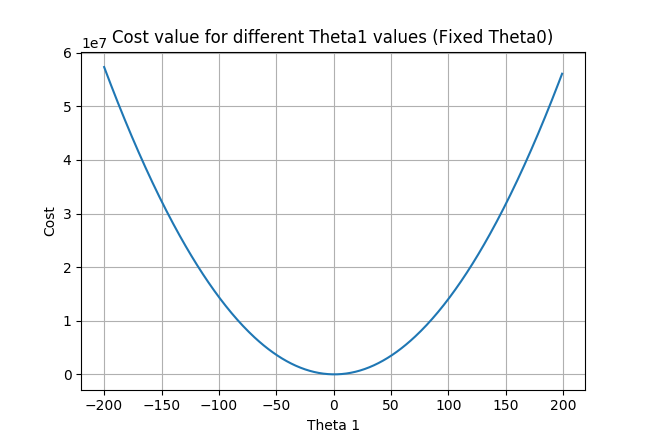

In [16]:
fig = plt.figure()
Z1=Z[i+100,:]
axisX=np.arange(minX,maxX,1)
plt.plot(axisX,Z1)
plt.xlabel('Theta 1')
plt.ylabel('Cost')
plt.title('Cost value for different Theta1 values (Fixed Theta0)')
plt.grid(True)
plt.show()